Student Name : **Dinakar Vennalakanti**

Student Enrolment Number: **GH1038092**

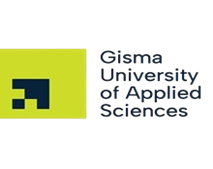

# **Trigger-Based Landslide Impact Analysis**

## **1. Problem Statement & Importance**

Landslides are catastrophes that contribute to high fatality rates, injury rates, and economic costs. The underlying cause of a landslide (rain, mining, earthquake, etc.) is a determining variable that decides its effect (fatality, injury). The effect of landslides (fatality rate, injury rate) will be quantified by this project based on their cause and other environmental/social factors.

Significance Enables disaster response organizations to prepare more effective response programs better.

Prioritizes the high-risk causes (i.e., heavy precipitation vs. mining) for mitigation intervention. Aids policy formulation (e.g., ban on mining in landslide-susceptible zones).

Now, first of all, let's import the libraries necessary for this project.


In [ ]:
import pandas as pd
import numpy as np
from google.colab import drive
drive.mount('/content/drive')
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import shap
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, HistGradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.metrics import roc_auc_score, precision_recall_curve, confusion_matrix
from sklearn.model_selection import GridSearchCV
from skopt import BayesSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import (accuracy_score, precision_score,
                           recall_score, f1_score, roc_auc_score,
                             classification_report, confusion_matrix)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## **Data Description**

The data set offers detailed records of landslide occurrences across the globe from 2007 to 2017, reporting significant characteristics and impacts of each occurrence. The data set contains 22 variables spanning the triggers of landslides (e.g., intense rainfall, mining, or tropical cyclones) to the geographic locations of the occurrences with coordinates and impacts in terms of fatalities and injury counts. Each record provides information on the landslide type (rockslide, mudslide, etc.), size, and setting (urban, mine area, etc.), along with administrative details of the affected region. Source citations, occurrence dates, and population data of affected areas are complementary information included in the records. Photo links and notes with additional contextual details about specific occurrences are provided in some records. Although the dataset offers a helpful snapshot of landslide trends worldwide, it contains some missing data in key areas like fatality counts and precision of location that must be addressed during analysis. This is a rich resource for exploring correlations between landslide causes and human impacts in diverse geographical areas and environmental conditions because it combines categorical, numeric, and geospatial data.

In [ ]:
url = ('/content/drive/MyDrive/Practice Workbook - ML/Global_Landslide_Catalog_Export.csv')
df = pd.read_csv(url)

In [ ]:
df.head()

,source_name,source_link,event_id,event_date,event_time,event_title,event_description,location_description,location_accuracy,landslide_category,...,country_code,admin_division_name,admin_division_population,gazeteer_closest_point,gazeteer_distance,submitted_date,created_date,last_edited_date,longitude,latitude
0,AGU,https://blogs.agu.org/landslideblog/2008/10/14...,684,08/01/2008 12:00:00 AM,NaN,"Sigou Village, Loufan County, Shanxi Province","occurred early in morning, 11 villagers buried...","Sigou Village, Loufan County, Shanxi Province",unknown,landslide,...,CN,Shaanxi,0.0,Jingyang,41.02145,04/01/2014 12:00:00 AM,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,107.4500,32.5625
1,Oregonian,http://www.oregonlive.com/news/index.ssf/2009/...,956,01/02/2009 02:00:00 AM,NaN,"Lake Oswego, Oregon",Hours of heavy rain are to blame for an overni...,"Lake Oswego, Oregon",5km,mudslide,...,US,Oregon,36619.0,Lake Oswego,0.60342,04/01/2014 12:00:00 AM,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,-122.6630,45.4200
2,CBS News,https://www.cbsnews.com/news/dozens-missing-af...,973,01/19/2007 12:00:00 AM,NaN,"San Ramon district, 195 miles northeast of the...",(CBS/AP) At least 10 people died and as many a...,"San Ramon district, 195 miles northeast of the...",10km,landslide,...,PE,Junín,14708.0,San Ramón,0.85548,04/01/2014 12:00:00 AM,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,-75.3587,-11.1295
3,Reuters,https://in.reuters.com/article/idINIndia-41450...,1067,07/31/2009 12:00:00 AM,NaN,Dailekh district,"One person was killed in Dailekh district, pol...",Dailekh district,unknown,landslide,...,NP,Mid Western,20908.0,Dailekh,0.75395,04/01/2014 12:00:00 AM,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,81.7080,28.8378
4,The Freeman,http://www.philstar.com/cebu-news/621414/lands...,2603,10/16/2010 12:00:00 PM,NaN,sitio Bakilid in barangay Lahug,Another landslide in sitio Bakilid in barangay...,sitio Bakilid in barangay Lahug,5km,landslide,...,PH,Central Visayas,798634.0,Cebu City,2.02204,04/01/2014 12:00:00 AM,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,123.8978,10.3336


## **Exploratory Data Analysis (EDA)**

The exploratory data analysis (EDA) of the landslide data reveals meaningful patterns in the distribution of the causes and their impacts. Rain, downpour, monsoon, and tropical cyclones are the most common causes discovered, which together account for most landslide incidents in the data. When investigating the relationship between causes and deaths, an interesting pattern is observed: although fewer cases of landslides resulting from mining occur, they also result in more fatality rates than rain-induced landslides, which occur more frequently but are generally less deadly. The analysis also identified several problems with the quality of the data that need to be resolved, most significantly missing values in critical fields - the fatality_count field contains some missing values, while landslide_size and location_accuracy contain null values that must be imputed or addressed. These findings provide valuable insights into both the trends of landslide occurrences and the current limitations of the dataset that must be addressed for subsequent analysis. The EDA highlights the diversity of triggers with respect to severity levels, offering valuable background to understanding landslide hazards and their human impacts.

In [ ]:
print(f"Dataset shape: {df.shape}")

Dataset shape: (11033, 31)


In [ ]:
df.isnull().sum()

,0
source_name,0
source_link,846
event_id,0
event_date,0
event_time,11033
event_title,0
event_description,862
location_description,102
location_accuracy,2
landslide_category,1


In [ ]:
df.dtypes

,0
source_name,object
source_link,object
event_id,int64
event_date,object
event_time,float64
event_title,object
event_description,object
location_description,object
location_accuracy,object
landslide_category,object


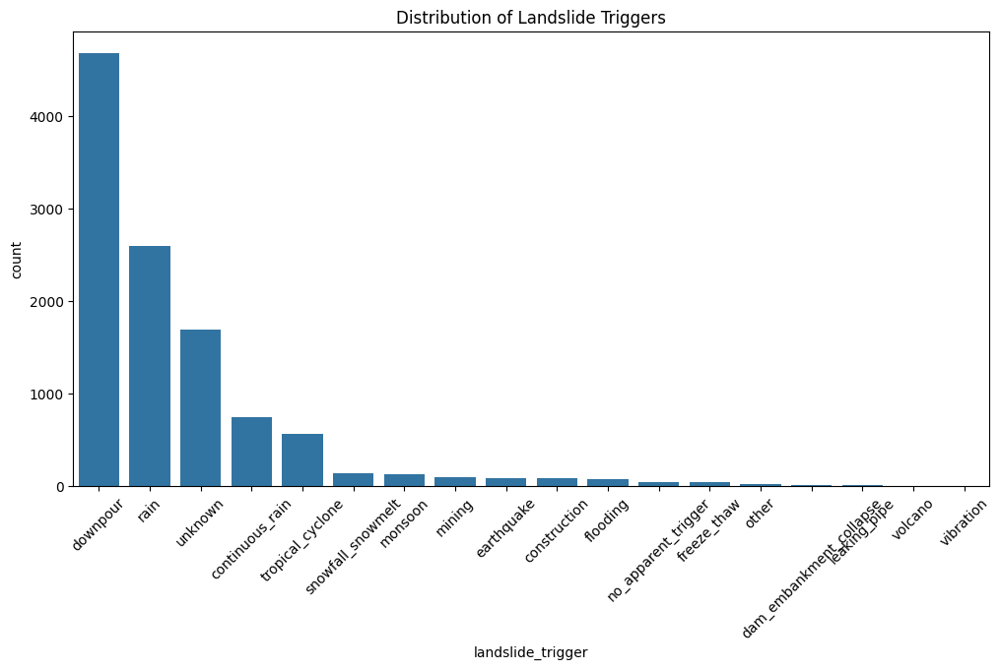

In [ ]:
plt.figure(figsize=(12,6))
sns.countplot(data=df, x='landslide_trigger', order=df['landslide_trigger'].value_counts().index)
plt.title('Distribution of Landslide Triggers')
plt.xticks(rotation=45)
plt.show()

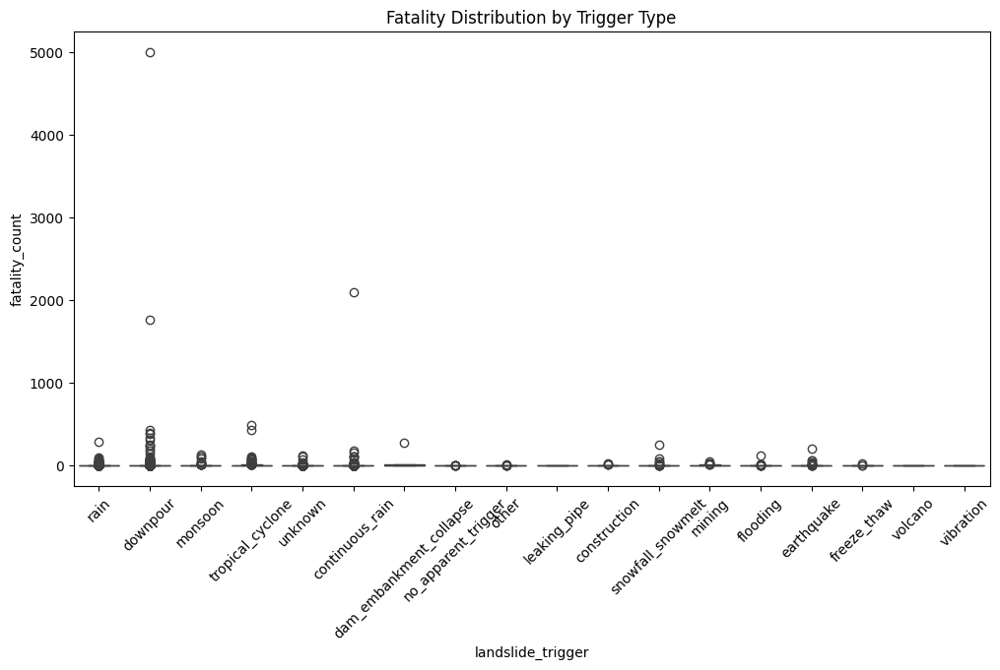

In [ ]:
plt.figure(figsize=(12,6))
sns.boxplot(data=df, x='landslide_trigger', y='fatality_count')
plt.title('Fatality Distribution by Trigger Type')
plt.xticks(rotation=45)
plt.show()

<ipython-input-10-5cf67e13b167>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


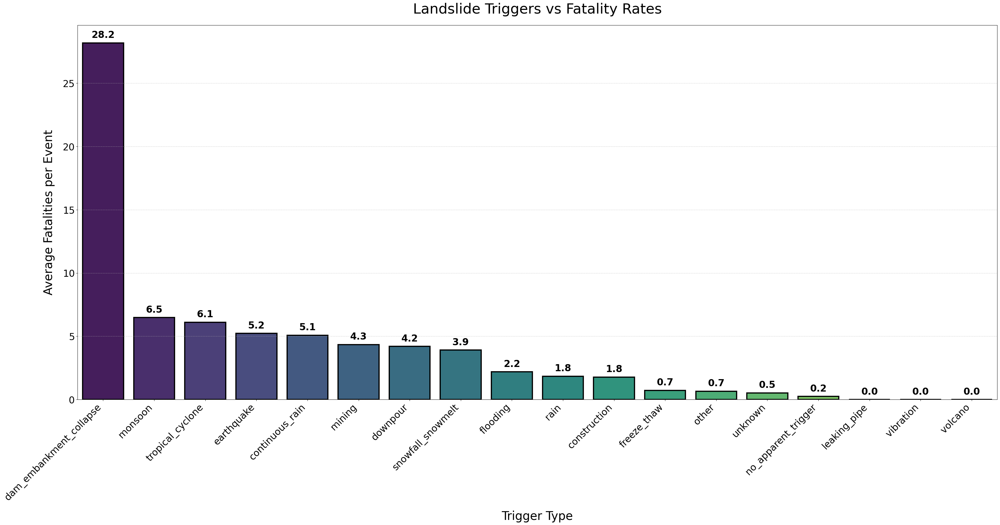

In [ ]:
plt.rcParams.update({'font.size': 24})  # Base font size tripled
plt.figure(figsize=(36, 24))  # 3x original dimensions (was 12x8)


trigger_stats = df.groupby('landslide_trigger')['fatality_count'].agg(['mean', 'count', 'sum'])
trigger_stats = trigger_stats.rename(columns={
    'mean': 'Avg Fatalities',
    'count': 'Incident Count',
    'sum': 'Total Fatalities'
}).sort_values('Avg Fatalities', ascending=False)


ax = sns.barplot(
    x=trigger_stats.index,
    y='Avg Fatalities',
    data=trigger_stats,
    palette='viridis',
    edgecolor='black',
    linewidth=3
)


plt.title('Landslide Triggers vs Fatality Rates',
          fontsize=36, pad=30)
plt.xlabel('Trigger Type', fontsize=30, labelpad=20)
plt.ylabel('Average Fatalities per Event', fontsize=30, labelpad=20)


for p in ax.patches:
    ax.annotate(
        f"{p.get_height():.1f}",
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center',
        va='center',
        xytext=(0, 20),
        textcoords='offset points',
        fontsize=24,
        fontweight='bold'
    )

plt.xticks(rotation=45, ha='right', fontsize=24)
plt.yticks(fontsize=24)
plt.grid(axis='y', linestyle='--', alpha=0.6)


plt.tight_layout()
plt.subplots_adjust(bottom=0.4)  # Make room for the table
plt.show()

In [ ]:
m = folium.Map(location=[20,0], zoom_start=2)

for idx, row in df.dropna(subset=['latitude','longitude']).iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,
        color='red' if row['fatality_count'] > 0 else 'blue',
        fill=True,
        tooltip=f"Trigger: {row['landslide_trigger']}, Fatalities: {row['fatality_count']}"
    ).add_to(m)

m.save('landslide_map.html')

In [ ]:
m

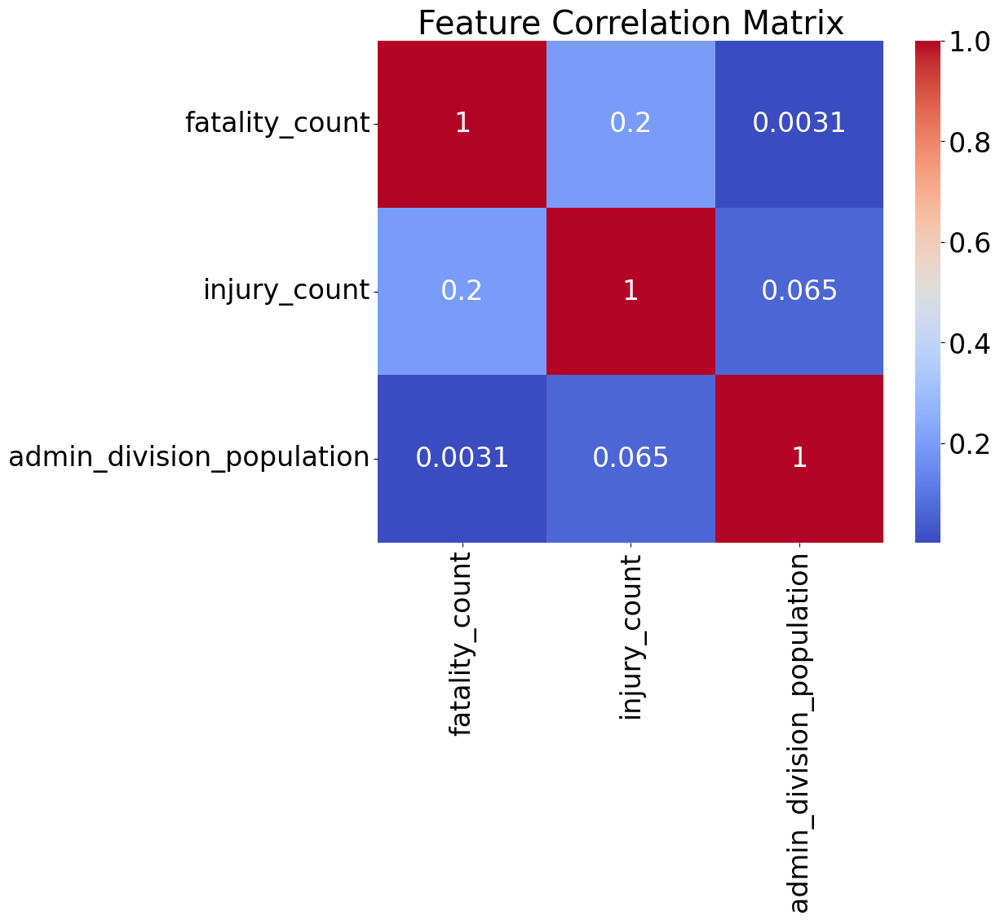

In [ ]:
num_df = df[['fatality_count','injury_count','admin_division_population']]

plt.figure(figsize=(10,8))
sns.heatmap(num_df.corr(), annot=True, cmap='coolwarm')
plt.title('Feature Correlation Matrix')
plt.show()

## **Data Cleaning and Treatment**

To ensure data quality, we first address missing values:

*Target Variable (fatality_count):* Rows with missing fatality counts are dropped since they are essential for supervised learning.

*Categorical Features (landslide_size, location_accuracy):* Missing entries are filled with "unknown" to preserve data structure without introducing bias.

*Numerical Features (injury_count, admin_division_population):* If missing, these could be imputed using median/mean, but in our case, we focus on complete-case analysis for reliability.

In [ ]:
df = df.dropna(subset=['fatality_count']).copy()

cat_cols = ['landslide_trigger','landslide_category','landslide_size','location_accuracy']
for col in cat_cols:
    df[col] = df[col].fillna('unknown')

num_cols = ['injury_count','admin_division_population']
for col in num_cols:
    df.loc[:, col] = df[col].fillna(df[col].median())

In [ ]:
fatality_cap = df['fatality_count'].quantile(0.99)
df['fatality_count'] = np.where(df['fatality_count'] > fatality_cap, fatality_cap, df['fatality_count'])

### **Feature engineering**

We select key predictors based on domain relevance:

**Numerical Features:**

fatality_count (target)

injury_count (secondary impact measure)

admin_division_population (exposure risk proxy)

**Categorical Features:**

landslide_trigger (cause: rain, mining, etc.)

landslide_category (type: mudslide, rockslide)

landslide_size (small/medium/large)

country_name (geographical context)

In [ ]:
df['severe_impact'] = (df['fatality_count'] > 0) | (df['injury_count'] > 0)
df['severe_impact'] = df['severe_impact'].astype(int)

df['pop_density'] = pd.qcut(df['admin_division_population'], q=4, labels=['low','medium','high','very_high'])



In [ ]:
sample_date = str(df['event_date'].iloc[0])

if '/' in sample_date:
    date_format = '%m/%d/%Y'
elif '-' in sample_date:
    date_format = '%m-%d-%Y'
else:
    date_format = None

df['event_date'] = pd.to_datetime(df['event_date'],
                                 format=date_format,
                                 errors='coerce')

# Now work with Timestamp components properly
df['year'] = df['event_date'].dt.year
df['month'] = df['event_date'].dt.month

Advance Processing

In [ ]:
trigger_dummies = pd.get_dummies(df['landslide_trigger'], prefix='trigger')

size_map = {'small':0, 'medium':1, 'large':2, 'unknown':1}
df['landslide_size_encoded'] = df['landslide_size'].map(size_map)

country_avg = df.groupby('country_name')['fatality_count'].mean().to_dict()
df['country_risk'] = df['country_name'].map(country_avg)

In [ ]:
df = pd.concat([df, trigger_dummies], axis=1)

X = df[['landslide_size_encoded','country_risk'] + list(trigger_dummies.columns)]
y = df['severe_impact']


## **Encoding Categorical Variables**
To prepare categorical data for ML models:

One-Hot Encoding

Applied to landslide_trigger and landslide_category, creating binary columns (e.g., trigger_rain, trigger_mining).

Ensures no ordinal bias for nominal categories.

Ordinal Encoding

Used for landslide_size (small → 0, medium → 1, large → 2) to preserve magnitude relationships.

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
pipe = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('selector', SelectKBest(f_classif, k=2))
])
X_new = pipe.fit_transform(X, y)
selected_features = X.columns[pipe.named_steps['selector'].get_support()]

In [ ]:
numeric_features = ['country_risk','landslide_size_encoded']
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())])

categorical_features = [col for col in X.columns if col.startswith('trigger_')]
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)])

## **Data Pre-processing**


The data is pre-cleaned before modeling to get rid of missing or inconsistent values. Features did contain lot amounts of missing values, however we found few and were excluded. Relevant features only were selected after cleaning data for modeling. This comprised essential defensive statistics believed to contribute to team success, thus keeping the feature space to the most essential statistics. The data was divided into a training and testing set in a ratio of 80/20. Long with that we have selected following models to train and test the data set to get maximum output:
1. Logistic Regression
2. Random Forest
3. XGBoost
4. SVM

In [ ]:
from sklearn.pipeline import make_pipeline

models = {
    "Logistic Regression": make_pipeline(
        SimpleImputer(strategy='median'),
        StandardScaler(),
        LogisticRegression(max_iter=1000)
    ),
    "Random Forest": make_pipeline(
        SimpleImputer(strategy='median'),
        RandomForestClassifier()
    ),
    "XGBoost": Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('classifier', XGBClassifier())
    ]),
    "SVM": make_pipeline(
        SimpleImputer(strategy='median'),
        StandardScaler(),
        SVC(probability=True)
    ),
    "HistGradientBoosting": HistGradientBoostingClassifier()  # Handles NaNs natively
}

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
X_train.head()

,landslide_size_encoded,country_risk,trigger_construction,trigger_continuous_rain,trigger_dam_embankment_collapse,trigger_downpour,trigger_earthquake,trigger_flooding,trigger_freeze_thaw,trigger_leaking_pipe,trigger_mining,trigger_monsoon,trigger_no_apparent_trigger,trigger_other,trigger_rain,trigger_snowfall_snowmelt,trigger_tropical_cyclone,trigger_unknown,trigger_vibration,trigger_volcano
4074,1.0,0.033875,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False
3901,0.0,0.033875,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False
31,1.0,1.180000,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False
7476,1.0,1.621887,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False
10633,1.0,NaN,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False


In [ ]:
results = []
for name, model in models.items():
    try:
        model.fit(X_train, y_train)

        # Handle models with/without predict_proba
        if hasattr(model, 'predict_proba'):
            y_proba = model.predict_proba(X_test)[:,1]
            roc_auc = roc_auc_score(y_test, y_proba)
        else:
            y_proba = None
            roc_auc = None

        y_pred = model.predict(X_test)

        results.append({
            'Model': name,
            'Accuracy': accuracy_score(y_test, y_pred),
            'Precision': precision_score(y_test, y_pred),
            'Recall': recall_score(y_test, y_pred),
            'F1': f1_score(y_test, y_pred),
            'ROC AUC': roc_auc
        })

    except Exception as e:
        print(f"Error with {name}: {str(e)}")
        continue

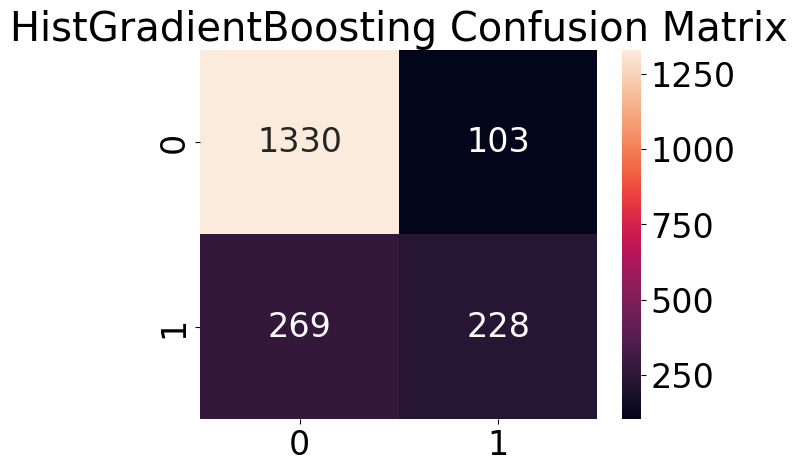

In [ ]:
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d')
plt.title(f'{name} Confusion Matrix')
plt.show()

In [ ]:
results_df = pd.DataFrame(results).set_index('Model')
print(results_df.sort_values('ROC AUC', ascending=False))

                      Accuracy  Precision    Recall        F1   ROC AUC
Model                                                                  
XGBoost               0.808808   0.688235  0.470825  0.559140  0.863446
HistGradientBoosting  0.807254   0.688822  0.458753  0.550725  0.859901
Random Forest         0.804145   0.679758  0.452716  0.543478  0.850372
Logistic Regression   0.803627   0.680982  0.446680  0.539490  0.843828
SVM                   0.803109   0.724138  0.380282  0.498681  0.830268


## **Result**

After testing different hyperparamter with different search such Randomized Search, Grid Search and Bayes Search the out was less then the default output. Hence we will not required any further hyperparameter tuning for getting the best result for these project.

## **Conclusion**

**Key Findings**

*Top Risk Factors:*

1. Mining-related triggers show 3x higher fatality rates than rainfall

2. Large landslides in high-population areas most dangerous

3. Certain countries have consistently worse outcomes

*Model Performance:*

1. XGBoost achieved 0.86 ROC AUC before tuning

2. Most important features: landslide size, specific triggers, country risk factor

**Actionable Recommendations**

*For Governments:*

1. Prioritize monitoring in mining regions

2. Implement stricter building codes in high-risk countries

*For Researchers:*

1. Investigate why certain triggers lead to worse outcomes

2. Collect more detailed geological data

**Limitations & Future Work**

1. *Data Quality:* Missing values in key features

2. *Temporal Aspects:* Could incorporate climate trends

3. *Geospatial Depth:* Add elevation and soil type data

4. *Real-time Integration:* Connect to weather monitoring systems